In [1]:
import os
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
import umap
import matplotlib.pyplot as plt
import plotly
import plotly.express as px
os.makedirs("visualizations", exist_ok=True)

Load data

In [2]:
X = np.load("npy_dir/vectors.npy")
labels = np.load("npy_dir/labels.npy")

Run PCA, only select first 50 components

In [3]:
PCA_fit = PCA().fit(X)

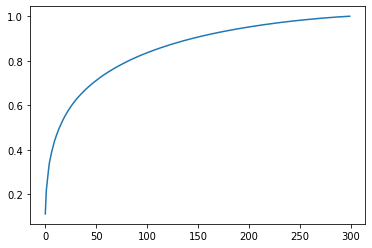

In [4]:
plt.plot(np.cumsum(PCA_fit.explained_variance_ratio_))

In [5]:
X_pca = PCA_fit.fit_transform(X)[:,0:50]

In [6]:
np.save('npy_dir/pca.npy', X_pca)

Run UMAP. Note that this gives a bunch of warning messages that are unimportant (this is a known issue with the umap-learn package)

In [7]:
X_umap = umap.UMAP().fit_transform(X_pca)

C:\Users\Brian\Anaconda3\envs\genreGenius\lib\site-packages\numba\typed_passes.py:271: NumbaPerformanceWarning:


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\..\..\Anaconda3\envs\genreGenius\lib\site-packages\umap\rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^


C:\Users\Brian\Anaconda3\envs\genreGenius\lib\site-packages\numba\typed_passes.py:271: NumbaPerformanceWarning:


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\..\..\Anaconda3\envs\genreGeni

In [8]:
np.save('npy_dir/umap.npy', X_umap)

Compile data and plot

In [9]:
df_umap = pd.DataFrame({"umap1": X_umap[:,0], "umap2": X_umap[:,1], "artist": labels[:,0], "title": labels[:,1]})

In [10]:
fig = px.scatter(df_umap, x="umap1", y="umap2", hover_data=["artist", "title"], render_mode="webgl")

In [11]:
fig.show()

In [12]:
plotly.offline.plot(fig, filename = 'visualizations/umap.html', auto_open=False)

'visualizations/umap.html'